TUGAS KELOMPOK CBIR

In [2]:
from google.colab import files
files.upload();


Saving kaggle.json to kaggle (1).json


In [3]:
!pip -q install kaggle
!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [4]:
!kaggle datasets download -d drgfreeman/rockpaperscissors -p /content/data

Dataset URL: https://www.kaggle.com/datasets/drgfreeman/rockpaperscissors
License(s): CC-BY-SA-4.0
 95% 292M/306M [00:00<00:00, 273MB/s]
100% 306M/306M [00:04<00:00, 69.4MB/s]


In [5]:
!unzip -q /content/data/rockpaperscissors.zip -d /content/data

In [6]:
!ls /content/data/

paper			  rock			 rps-cv-images
README_rpc-cv-images.txt  rockpaperscissors.zip  scissors


In [7]:
import os, shutil

SRC_ROOT = "/content/data"
DST_ROOT = "/content/dataset"

os.makedirs(DST_ROOT, exist_ok=True)

for cls in ["rock", "paper", "scissors"]:
    src = os.path.join(SRC_ROOT, cls)
    dst = os.path.join(DST_ROOT, cls)
    if os.path.exists(src):
        shutil.move(src, dst)
        print(f"Moved: {cls}")
    else:
        print(f"Folder not found: {src}")

!ls -R /content/dataset | head -n 20

Moved: rock
Moved: paper
Moved: scissors
/content/dataset:
paper
rock
scissors

/content/dataset/paper:
04l5I8TqdzF9WDMJ.png
0a3UtNzl5Ll3sq8K.png
0cb6cVL8pkfi4wF6.png
0eqArS2GgsBeqgSn.png
0Og76sl5CJhbxWWx.png
0RA9rcrv8iVvuDDU.png
0t08v9bAaA0mXGCQ.png
0Uomd0HvOB33m47I.png
0vugygEjxQJPr9yz.png
0zKU6wEhT2cDe9j0.png
14K62H4KG1hg5qiJ.png
1Dfw5FRlS4h60JPX.png
1fKclJk4eBWOQSR1.png
1Frbe8cdOdkciOBg.png


In [8]:
import os, glob, json, math, random
import numpy as np
import cv2
import matplotlib.pyplot as plt

from skimage.feature import graycomatrix, graycoprops
from skimage.color import rgb2gray
from sklearn.preprocessing import StandardScaler
from scipy.spatial.distance import cosine, euclidean
from tabulate import tabulate

DATASET_DIR   = "/content/dataset"
TOP_K         = 5
USE_COSINE    = False #menggunakan eucleudian
MASK_BACKGROUND = True

WEIGHT_COLOR   = 1.0
WEIGHT_TEXTURE = 1.0
WEIGHT_SHAPE   = 1.0


MAX_PER_CLASS = 27

In [9]:
def list_images_by_class(root):
    items = []
    for cls in sorted(os.listdir(root)):
        p = os.path.join(root, cls)
        if os.path.isdir(p):
            for ext in ("*.jpg","*.jpeg","*.png"):
                for fp in glob.glob(os.path.join(p, ext)):
                    items.append((fp, cls))
    return items

dataset = list_images_by_class(DATASET_DIR)
assert dataset, f"error path {DATASET_DIR}"

#limit setiap class 27 total 81
if isinstance(MAX_PER_CLASS, int):
    kept, count = [], {}
    for path, cls in dataset:
        if count.get(cls, 0) < MAX_PER_CLASS:
            kept.append((path, cls))
            count[cls] = count.get(cls, 0) + 1
    dataset = kept
    print("Class :", count)
else:
    print(f"Menggunakan dataset lengkap {len(dataset)} images.")


Class : {'paper': 27, 'rock': 27, 'scissors': 27}


## Preprocess **masking**

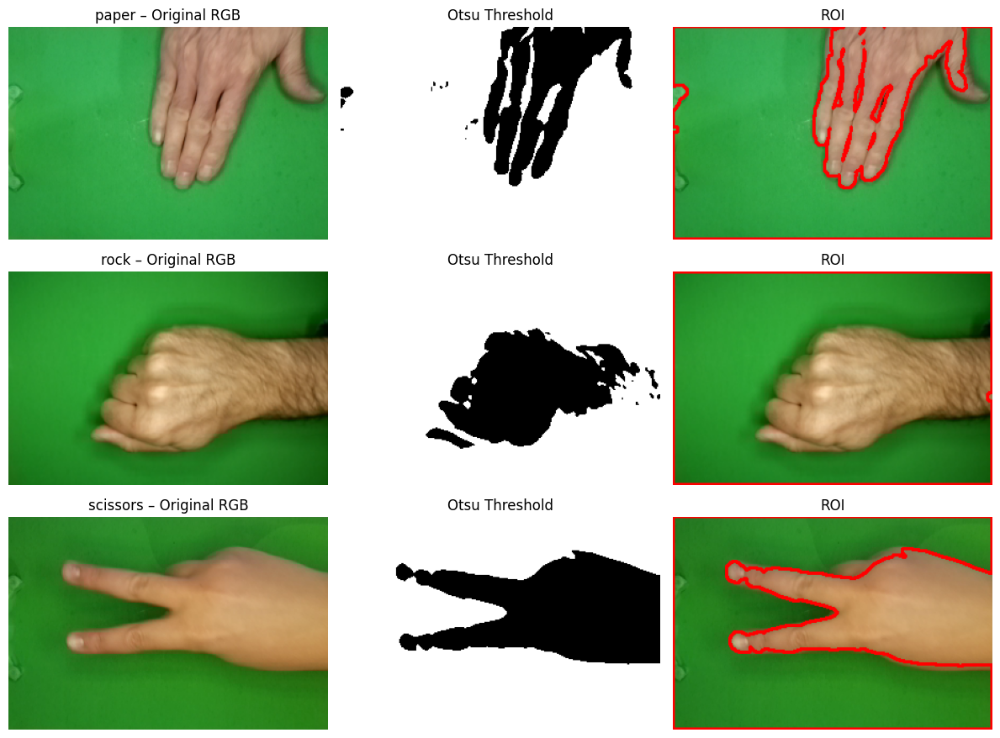

In [10]:
import matplotlib.pyplot as plt

def imread_rgb(path):
    bgr = cv2.imread(path, cv2.IMREAD_COLOR)
    if bgr is None:
        raise ValueError(f"Error Path: {path}")
    return cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

def hand_mask_and_roi(img_rgb):
    gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
    blur = cv2.GaussianBlur(gray, (5,5), 0)
    _, th = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    if (th==255).sum() < (th==0).sum():
        th = 255 - th

    cnts, _ = cv2.findContours(th, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not cnts:
        h, w = th.shape
        return np.zeros((h,w), np.uint8), img_rgb, th

    c = max(cnts, key=cv2.contourArea)
    x, y, w, h = cv2.boundingRect(c)

    roi_img  = img_rgb[y:y+h, x:x+w].copy()
    roi_mask = th[y:y+h, x:x+w].copy()
    roi_mask = cv2.erode(roi_mask, np.ones((3,3), np.uint8), iterations=1)
    return roi_mask, roi_img, th

examples = {}
for path, cls in dataset:
    if cls not in examples:
        examples[cls] = path
    if len(examples) == 3:
        break

plt.figure(figsize=(12, 9))
for i, (cls, path) in enumerate(examples.items(), 1):
    img = imread_rgb(path)
    mask, roi_img, th = hand_mask_and_roi(img)
    vis = roi_img.copy()
    cnts, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(vis, cnts, -1, (255,0,0), 2)

    plt.subplot(3, 3, (i-1)*3 + 1)
    plt.imshow(img); plt.axis("off"); plt.title(f"{cls} – Original RGB")

    plt.subplot(3, 3, (i-1)*3 + 2)
    plt.imshow(th, cmap="gray"); plt.axis("off"); plt.title("Otsu Threshold")

    plt.subplot(3, 3, (i-1)*3 + 3)
    plt.imshow(vis); plt.axis("off"); plt.title("ROI")

plt.tight_layout()
plt.show()



## Fitur **Extraction**


In [11]:
def extract_color_features(img_rgb):
    # HSV 3D histogram (8-8-8) Mask contour digunakan tanpa backround
    if MASK_BACKGROUND:
        mask, roi_img, _ = hand_mask_and_roi(img_rgb)
        hsv = cv2.cvtColor(roi_img, cv2.COLOR_RGB2HSV)
        hist = cv2.calcHist([hsv], [0,1,2], mask, [8,8,8], [0,180, 0,256, 0,256])
    else:
        hsv  = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2HSV)
        hist = cv2.calcHist([hsv], [0,1,2], None, [8,8,8], [0,180, 0,256, 0,256])

    #normalisasi histogram
    hist = cv2.normalize(hist, hist).flatten()

    #aplikasi statistik mean, std, skew, kurt
    mean, std = hist.mean(), hist.std() + 1e-12
    skew = ((hist-mean)**3).mean() / (std**3)
    kurt = ((hist-mean)**4).mean() / (std**4)

    return np.concatenate(([mean, std, skew, kurt], hist)).astype("float32")

def extract_texture_features(img_rgb):
    # glcm pada roi tangan
    if MASK_BACKGROUND:
        mask, roi_img, _ = hand_mask_and_roi(img_rgb)
        gray = (rgb2gray(roi_img) * 255).astype('uint8')
        inpaint_mask = (mask == 0).astype('uint8') * 255
        gray_filled = cv2.inpaint(gray, inpaint_mask, 3, cv2.INPAINT_TELEA)
        base = gray_filled
    else:
        base = (rgb2gray(img_rgb) * 255).astype('uint8')

    #aplikasi penggunaan 4 arah berbeda 0, 45, 90, 135
    glcm = graycomatrix(base, distances=[1],
                        angles=[0, np.pi/4, np.pi/2, 3*np.pi/4],
                        symmetric=True, normed=True)
    feats = [graycoprops(glcm, p).mean() for p in ('contrast','correlation','energy','homogeneity')]
    return np.array(feats, dtype="float32")

def extract_shape_features(img_rgb):
   # Area, perimeter, aspect ratio, extent, solidity, circularity dari contour terbesar."""
    gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
    blur = cv2.GaussianBlur(gray, (5,5), 0)
    _, th = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    if (th==255).sum() < (th==0).sum():
        th = 255 - th

    cnts, _ = cv2.findContours(th, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not cnts:
        return np.zeros(6, dtype="float32")
    c = max(cnts, key=cv2.contourArea)

    area = float(cv2.contourArea(c))
    peri = float(cv2.arcLength(c, True)) + 1e-8
    x,y,w,h = cv2.boundingRect(c)
    aspect = float(w) / max(h, 1)
    extent = area / max(w*h, 1)
    hull = cv2.convexHull(c)
    solidity = area / max(cv2.contourArea(hull), 1e-8)
    circularity = (4 * math.pi * area) / (peri**2)

    return np.array([area, peri, aspect, extent, solidity, circularity], dtype="float32")


## **Test Visualisasi extraksi fitur**

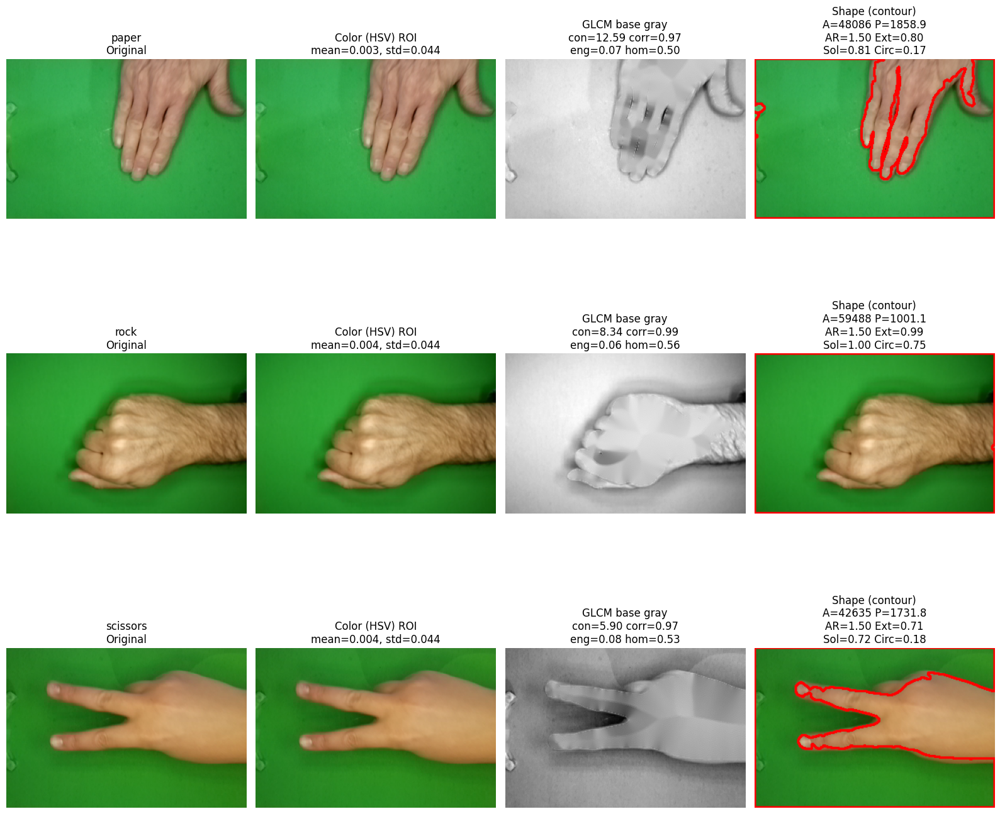

In [12]:
import matplotlib.pyplot as plt
from skimage.color import rgb2gray

def visualisasi_ektraksi_class():
    examples = {}
    for path, cls in dataset:
        if cls not in examples:
            examples[cls] = path
        if len(examples) == 3:  # rock, paper, scissors
            break

    n_rows = len(examples)
    plt.figure(figsize=(16, 5 * n_rows))

    for r, (cls, path) in enumerate(examples.items(), start=1):
        img = imread_rgb(path)

        # mask roi
        roi_mask, roi_img, th_full = hand_mask_and_roi(img)

        # warna pada ROI mask
        if MASK_BACKGROUND:
            hsv = cv2.cvtColor(roi_img, cv2.COLOR_RGB2HSV)
            hist = cv2.calcHist([hsv], [0,1,2], roi_mask, [8,8,8], [0,180,0,256,0,256])
        else:
            hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
            hist = cv2.calcHist([hsv], [0,1,2], None, [8,8,8], [0,180,0,256,0,256])
        hist = cv2.normalize(hist, hist)


        hflat = hist.flatten()
        c_mean = float(hflat.mean())
        c_std  = float(hflat.std() + 1e-12)
        c_skew = float(((hflat - c_mean)**3).mean() / (c_std**3))
        c_kurt = float(((hflat - c_mean)**4).mean() / (c_std**4))


        # GLCM pada mask ROI inpainted (texture)
        if MASK_BACKGROUND:
            gray_roi = (rgb2gray(roi_img) * 255).astype('uint8')
            inpaint_mask = (roi_mask == 0).astype('uint8') * 255
            gray_tex = cv2.inpaint(gray_roi, inpaint_mask, 3, cv2.INPAINT_TELEA)
        else:
            gray_tex = (rgb2gray(img) * 255).astype('uint8')

        glcm = graycomatrix(gray_tex, distances=[1],
                            angles=[0, np.pi/4, np.pi/2, 3*np.pi/4],
                            symmetric=True, normed=True)
        t_contrast    = float(graycoprops(glcm, 'contrast').mean())
        t_correlation = float(graycoprops(glcm, 'correlation').mean())
        t_energy      = float(graycoprops(glcm, 'energy').mean())
        t_homogeneity = float(graycoprops(glcm, 'homogeneity').mean())

        # bentuk
        gray_s = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        blur_s = cv2.GaussianBlur(gray_s, (5,5), 0)
        _, th = cv2.threshold(blur_s, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        if (th==255).sum() < (th==0).sum():
            th = 255 - th
        cnts, _ = cv2.findContours(th, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        shape_vis = img.copy()
        if cnts:
            c = max(cnts, key=cv2.contourArea)
            cv2.drawContours(shape_vis, [c], -1, (255, 0, 0), 2)
            area = float(cv2.contourArea(c))
            peri = float(cv2.arcLength(c, True)) + 1e-8
            x,y,w,h = cv2.boundingRect(c)
            aspect = float(w) / max(h, 1)
            extent = area / max(w*h, 1)
            hull = cv2.convexHull(c)
            solidity = area / max(cv2.contourArea(hull), 1e-8)
            circularity = (4 * math.pi * area) / (peri**2)
        else:
            area = peri = aspect = extent = solidity = circularity = float('nan')

        # plotting
        # Oringinal
        ax = plt.subplot(n_rows, 4, (r - 1) * 4 + 1)
        ax.imshow(img); ax.axis("off")
        ax.set_title(f"{cls}\nOriginal")

        # Warna
        ax = plt.subplot(n_rows, 4, (r - 1) * 4 + 2)
        if MASK_BACKGROUND:
            ax.imshow(cv2.cvtColor(roi_img, cv2.COLOR_RGB2BGR)[:,:,::-1])  #ROI
            tit = "Color (HSV) ROI"
        else:
            ax.imshow(cv2.cvtColor(img, cv2.COLOR_RGB2BGR)[:,:,::-1])
            tit = "Color (HSV) Full"
        ax.axis("off"); ax.set_title(tit + f"\nmean={c_mean:.3f}, std={c_std:.3f}")

        # Tekstur GLSM
        ax = plt.subplot(n_rows, 4, (r - 1) * 4 + 3)
        ax.imshow(gray_tex, cmap="gray"); ax.axis("off")
        ax.set_title(f"GLCM base gray\ncon={t_contrast:.2f} corr={t_correlation:.2f}\neng={t_energy:.2f} hom={t_homogeneity:.2f}")

        # Bentuk
        ax = plt.subplot(n_rows, 4, (r - 1) * 4 + 4)
        ax.imshow(shape_vis); ax.axis("off")
        ax.set_title(f"Shape (contour)\nA={area:.0f} P={peri:.1f}\nAR={aspect:.2f} Ext={extent:.2f}\nSol={solidity:.2f} Circ={circularity:.2f}")

    plt.tight_layout()
    plt.show()


visualisasi_ektraksi_class()

Fitur database

In [13]:
db_color, db_tex, db_shape, db_meta = [], [], [], []

for path, cls in dataset:
    img = imread_rgb(path)
    db_color.append(extract_color_features(img))
    db_tex.append(extract_texture_features(img))
    db_shape.append(extract_shape_features(img))
    db_meta.append((path, cls))

db_color = np.vstack(db_color)
db_tex   = np.vstack(db_tex)
db_shape = np.vstack(db_shape)

sc_color = StandardScaler().fit(db_color)
sc_tex   = StandardScaler().fit(db_tex)
sc_shape = StandardScaler().fit(db_shape)

db_color_s = sc_color.transform(db_color)
db_tex_s   = sc_tex.transform(db_tex)
db_shape_s = sc_shape.transform(db_shape)

db_combined = np.hstack([
    WEIGHT_COLOR*db_color_s,
    WEIGHT_TEXTURE*db_tex_s,
    WEIGHT_SHAPE*db_shape_s
])

print(f"Indexed {len(db_meta)} images.")


Indexed 81 images.


## **Retrieval dan Visualisasi (pencarian)**

In [14]:
def rank(db_feats, q_feat, topk=5, use_cosine=False):
    dists = []
    for i, f in enumerate(db_feats):
        d = cosine(q_feat, f) if use_cosine else euclidean(q_feat, f)
        dists.append((i, float(d)))
    dists.sort(key=lambda x: x[1])
    return dists[:topk]

def show_results(query_img, results, title="Results"):
    plt.figure(figsize=(13,3))
    plt.subplot(1, TOP_K+1, 1)
    plt.imshow(query_img); plt.axis("off"); plt.title("Query")
    for i, (idx, dist) in enumerate(results, start=1):
        img = imread_rgb(db_meta[idx][0])
        label = db_meta[idx][1]
        plt.subplot(1, TOP_K+1, i+1)
        plt.imshow(img); plt.axis("off")
        plt.title(f"#{i} {label}\n{dist:.2f}")
    plt.suptitle(title); plt.tight_layout(); plt.show()


In [15]:
import random
from collections import defaultdict

def queries_per_class(num_per_class=5, feature="combined", class_order=("rock","paper","scissors")):


    items_by_class = defaultdict(list)
    for path, cls in dataset:
        items_by_class[cls].append(path)


    def pick_feature_space(which):
        if which == "color":
            return db_color_s, lambda q: sc_color.transform([extract_color_features(q)])[0]
        if which == "glcm":
            return db_tex_s,   lambda q: sc_tex.transform([extract_texture_features(q)])[0]
        if which == "shape":
            return db_shape_s, lambda q: sc_shape.transform([extract_shape_features(q)])[0]

        # combined
        return db_combined, lambda q: np.concatenate([
            WEIGHT_COLOR  * sc_color.transform([extract_color_features(q)])[0],
            WEIGHT_TEXTURE* sc_tex.transform([extract_texture_features(q)])[0],
            WEIGHT_SHAPE  * sc_shape.transform([extract_shape_features(q)])[0],
        ])

    db_feats, qfeat_fn = pick_feature_space(feature)

    total_done = 0
    for cls in class_order:
        pool = items_by_class.get(cls, [])
        if not pool:
            print(f" error -  '{cls}'. lewatkan.")
            continue


        if len(pool) >= num_per_class:
            picks = random.sample(pool, num_per_class)
        else:
            picks = [random.choice(pool) for _ in range(num_per_class)]

        print(f"\n = {cls.upper()} QUERIES ({len(picks)} images) — fitur: {feature} = ")
        for i, q_path in enumerate(picks, start=1):
            q_img = imread_rgb(q_path)
            q_feat = qfeat_fn(q_img)

            results = rank(db_feats, q_feat, TOP_K, USE_COSINE) # 5 terbaik USE_COSINE == FALSE (EUCLIDEAN)

            print(f"\n[{cls} #{i}] Query: {os.path.basename(q_path)}")
            for rnk, (idx, dist) in enumerate(results, 1):
                lab = db_meta[idx][1]
                mark = "ok" if lab == cls else "--"
                print(f"  {rnk}. {os.path.basename(db_meta[idx][0]):18s} | {lab:10s} | {mark} | d={dist:.4f}")

            # hasil visualisasi Top-K k (k=5)
            show_results(q_img, results, title=f"{cls} query #{i} — Top-{TOP_K} ({feature})")

            total_done += 1

    print(f"\nDone. Total query: {total_done} (target {len(class_order)*num_per_class}).")

query combine (warna+glcm+bentuk)


 = ROCK QUERIES (5 images) — fitur: combined = 

[rock #1] Query: zrrYLvM2uywyFwRy.png
  1. zrrYLvM2uywyFwRy.png | rock       | ok | d=0.0000
  2. eTkUxksFCvfsbVLs.png | scissors   | -- | d=25.3702
  3. Tghe750qrbh7MMpP.png | scissors   | -- | d=25.4449
  4. mkUctpckc3vjOwKa.png | paper      | -- | d=25.4722
  5. z5l2JCxLM7igVya5.png | scissors   | -- | d=25.6032


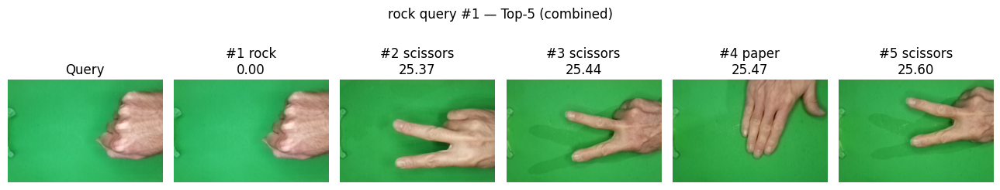


[rock #2] Query: lcZcrpCoDl7Y1AUF.png
  1. lcZcrpCoDl7Y1AUF.png | rock       | ok | d=0.0000
  2. aB0M38mmr711uzAY.png | rock       | ok | d=5.5895
  3. eb93o1ZDeBlrdfyc.png | rock       | ok | d=5.7130
  4. JOaPrPIINVvoI9l4.png | rock       | ok | d=5.7254
  5. 7gnNbHRprrV3r7kX.png | scissors   | -- | d=5.8079


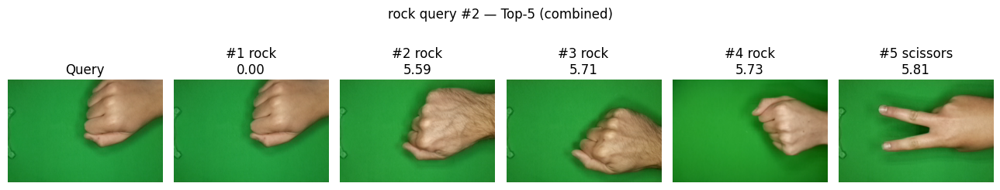


[rock #3] Query: bn4i63wrObqbJECw.png
  1. bn4i63wrObqbJECw.png | rock       | ok | d=0.0000
  2. Mwr4GgRRk6BgHDVL.png | rock       | ok | d=29.9648
  3. eb93o1ZDeBlrdfyc.png | rock       | ok | d=31.0063
  4. aB0M38mmr711uzAY.png | rock       | ok | d=31.0400
  5. Lq77eAG8OPaizwEd.png | paper      | -- | d=31.0829


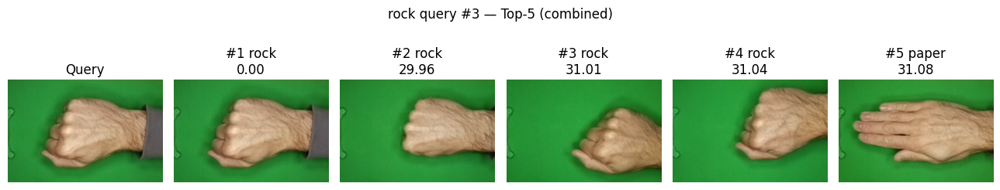


[rock #4] Query: 2NmrcDGkc7FQuu12.png
  1. 2NmrcDGkc7FQuu12.png | rock       | ok | d=0.0000
  2. aB0M38mmr711uzAY.png | rock       | ok | d=6.3219
  3. dpmWj9s5ily8GuyY.png | scissors   | -- | d=6.8513
  4. 8pxbBnbfqzX3ijVM.png | rock       | ok | d=6.9790
  5. 86KzO2PHymh6qYQ4.png | rock       | ok | d=7.2547


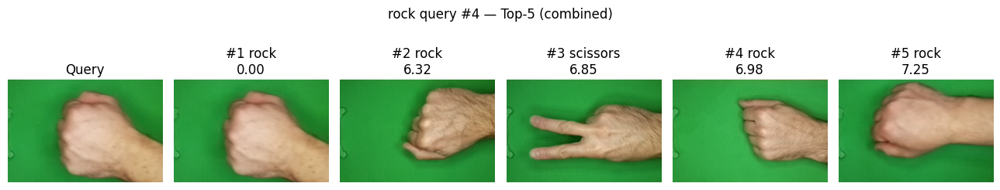


[rock #5] Query: clIAiFiURAZ36c8y.png
  1. clIAiFiURAZ36c8y.png | rock       | ok | d=0.0000
  2. SjtYrw48VCBOLOQh.png | paper      | -- | d=38.1199
  3. U4HuPlTKsnXYExzJ.png | rock       | ok | d=42.2988
  4. a9YV7Tzoj751vTun.png | scissors   | -- | d=42.3766
  5. U3EwYhdeoTjy3xBf.png | rock       | ok | d=42.5785


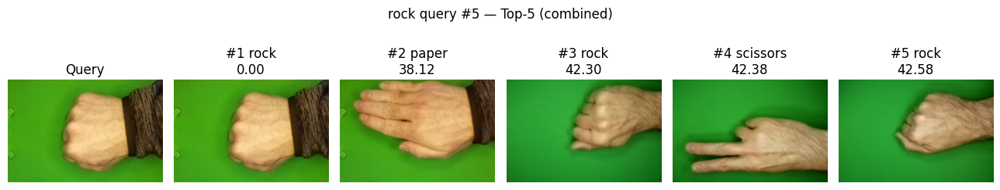


 = PAPER QUERIES (5 images) — fitur: combined = 

[paper #1] Query: Lq77eAG8OPaizwEd.png
  1. Lq77eAG8OPaizwEd.png | paper      | ok | d=0.0000
  2. C9tAvywdtjDTnllg.png | paper      | ok | d=3.6016
  3. B08mrGoODd5gGTvu.png | paper      | ok | d=3.8511
  4. aw7H9dMuThRnO74k.png | paper      | ok | d=4.1954
  5. XQihGnpPBb3DucOm.png | paper      | ok | d=4.9577


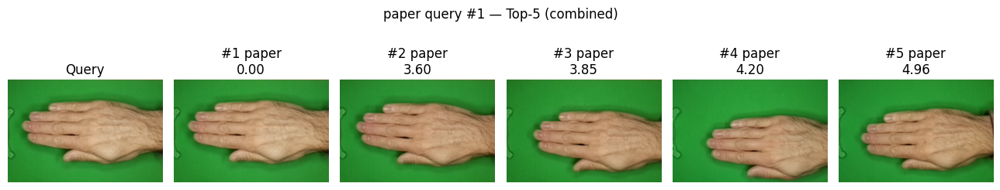


[paper #2] Query: pVCqrp8S6Ze3DAI8.png
  1. pVCqrp8S6Ze3DAI8.png | paper      | ok | d=0.0000
  2. ntumvg6vWpT6qIal.png | paper      | ok | d=7.5796
  3. dpmWj9s5ily8GuyY.png | scissors   | -- | d=7.7640
  4. FFGftZrGnvN8rRqN.png | scissors   | -- | d=7.7808
  5. XPvABb1iOSQx69Dq.png | scissors   | -- | d=7.9915


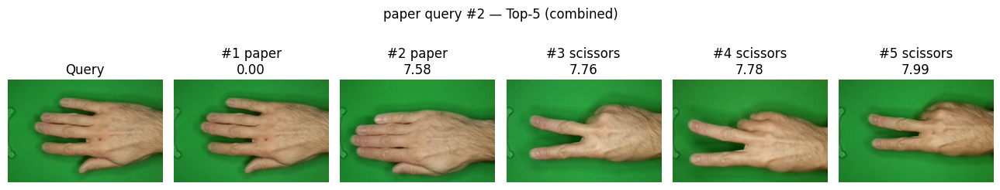


[paper #3] Query: B08mrGoODd5gGTvu.png
  1. B08mrGoODd5gGTvu.png | paper      | ok | d=0.0000
  2. C9tAvywdtjDTnllg.png | paper      | ok | d=1.9999
  3. aw7H9dMuThRnO74k.png | paper      | ok | d=2.8749
  4. 7gnNbHRprrV3r7kX.png | scissors   | -- | d=3.3317
  5. XQihGnpPBb3DucOm.png | paper      | ok | d=3.4910


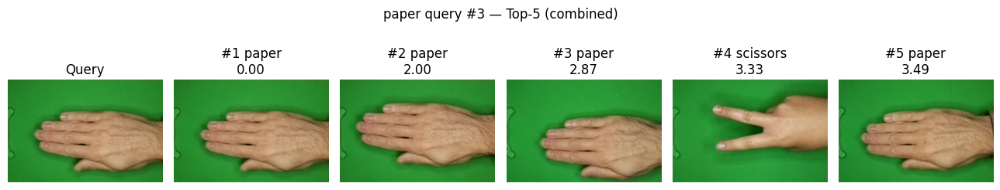


[paper #4] Query: ueuECCtQxOjHF1ij.png
  1. ueuECCtQxOjHF1ij.png | paper      | ok | d=0.0000
  2. XQihGnpPBb3DucOm.png | paper      | ok | d=5.2443
  3. aw7H9dMuThRnO74k.png | paper      | ok | d=5.4219
  4. C9tAvywdtjDTnllg.png | paper      | ok | d=5.4812
  5. B08mrGoODd5gGTvu.png | paper      | ok | d=5.6073


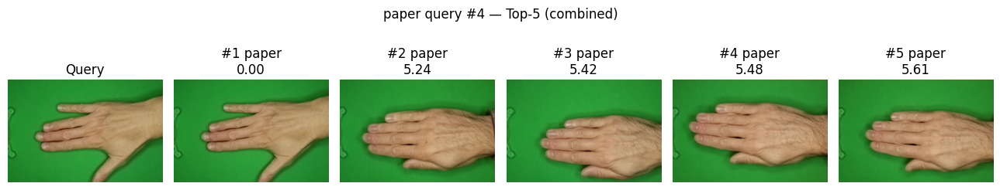


[paper #5] Query: o0CfvFooVIcHCGzO.png
  1. o0CfvFooVIcHCGzO.png | paper      | ok | d=0.0000
  2. kyzq1dNdXgG9OZDb.png | scissors   | -- | d=7.9158
  3. cPuxKnJCdcTotM5k.png | scissors   | -- | d=9.6284
  4. z5l2JCxLM7igVya5.png | scissors   | -- | d=9.7068
  5. wuoizA09gXbcCZ5a.png | scissors   | -- | d=9.7157


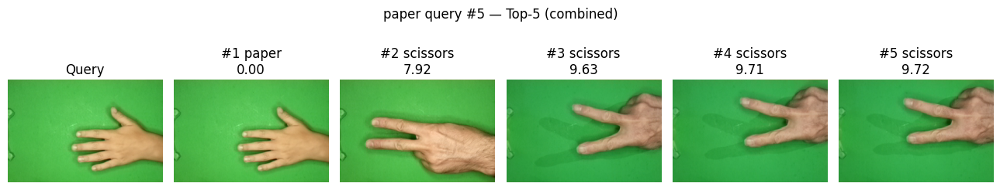


 = SCISSORS QUERIES (5 images) — fitur: combined = 

[scissors #1] Query: sWC2BZ7oeSzsCXva.png
  1. sWC2BZ7oeSzsCXva.png | scissors   | ok | d=0.0000
  2. U3EwYhdeoTjy3xBf.png | rock       | -- | d=5.4509
  3. mK7Kqflg12vHFBEK.png | paper      | -- | d=6.5405
  4. Eolm0Lo5dzVwDYqB.png | scissors   | ok | d=6.6674
  5. 1VRzspyXpQ6A2rKy.png | scissors   | ok | d=6.7872


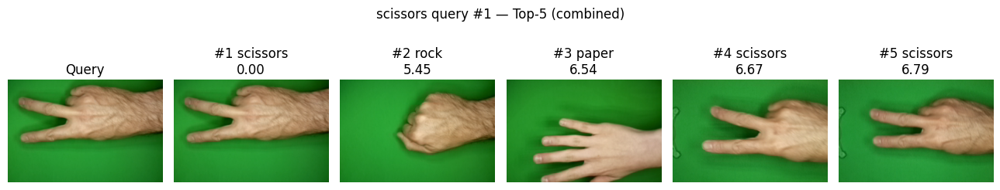


[scissors #2] Query: cPuxKnJCdcTotM5k.png
  1. cPuxKnJCdcTotM5k.png | scissors   | ok | d=0.0000
  2. wuoizA09gXbcCZ5a.png | scissors   | ok | d=0.9445
  3. z5l2JCxLM7igVya5.png | scissors   | ok | d=1.3009
  4. Tghe750qrbh7MMpP.png | scissors   | ok | d=2.1112
  5. HYMbsGR9sq7jfwQp.png | scissors   | ok | d=2.1774


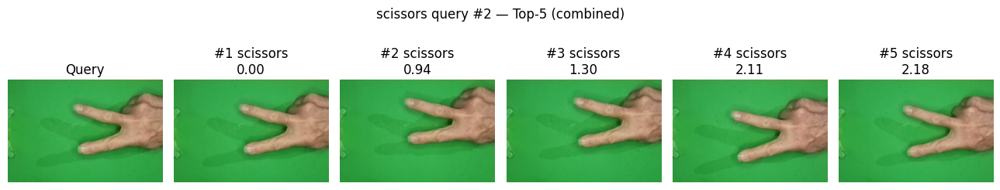


[scissors #3] Query: kM3ks8HWMjhbBPWU.png
  1. kM3ks8HWMjhbBPWU.png | scissors   | ok | d=0.0000
  2. 5QHP8zydBsbWyt4T.png | scissors   | ok | d=3.1110
  3. mK7Kqflg12vHFBEK.png | paper      | -- | d=5.6662
  4. U3EwYhdeoTjy3xBf.png | rock       | -- | d=5.7047
  5. aKUFn8PEF7LP8BaX.png | paper      | -- | d=6.7957


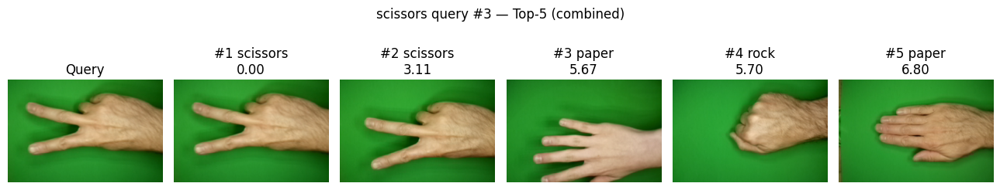


[scissors #4] Query: 5inLBb6qZY0gpX3b.png
  1. 5inLBb6qZY0gpX3b.png | scissors   | ok | d=0.0000
  2. zb6wXq49QppiS9sf.png | paper      | -- | d=9.5188
  3. Kp9F0tIiHIT310h6.png | rock       | -- | d=11.2655
  4. IkSLcJtq4O6iBmE4.png | paper      | -- | d=11.8933
  5. 7wFK6yhjKaNkhwZs.png | rock       | -- | d=13.2093


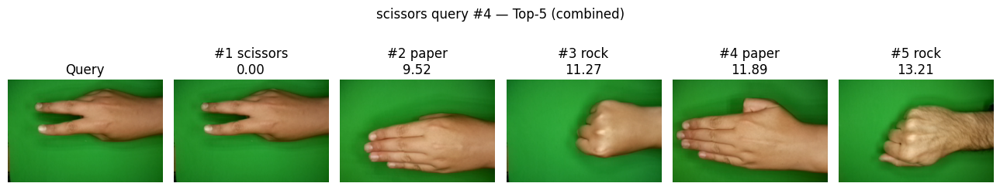


[scissors #5] Query: g6KeAGhgzo4NSYWc.png
  1. g6KeAGhgzo4NSYWc.png | scissors   | ok | d=0.0000
  2. 7gnNbHRprrV3r7kX.png | scissors   | ok | d=3.2185
  3. Eolm0Lo5dzVwDYqB.png | scissors   | ok | d=3.9226
  4. eb93o1ZDeBlrdfyc.png | rock       | -- | d=3.9674
  5. XPvABb1iOSQx69Dq.png | scissors   | ok | d=4.2800


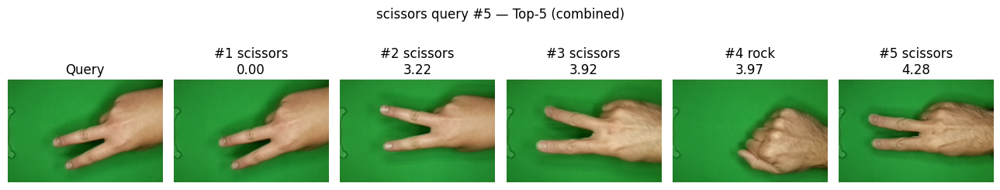


Done. Total query: 15 (target 15).


In [16]:
queries_per_class(num_per_class=5, feature="combined", class_order=("rock","paper","scissors"))

query color HSV


 = ROCK QUERIES (5 images) — fitur: color = 

[rock #1] Query: 5uXiqEc4q2Vi0NCX.png
  1. 5uXiqEc4q2Vi0NCX.png | rock       | ok | d=0.0000
  2. JOaPrPIINVvoI9l4.png | rock       | ok | d=9.5578
  3. lcZcrpCoDl7Y1AUF.png | rock       | ok | d=10.3703
  4. nOTm1e00MAJxvpwp.png | paper      | -- | d=10.6873
  5. aKUFn8PEF7LP8BaX.png | paper      | -- | d=11.0720


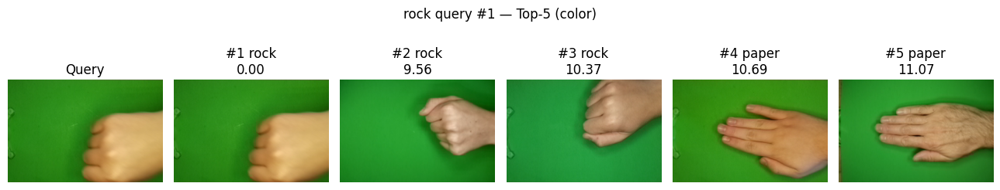


[rock #2] Query: nKBG8QSEBTwgkoVp.png
  1. nKBG8QSEBTwgkoVp.png | rock       | ok | d=0.0000
  2. Mwr4GgRRk6BgHDVL.png | rock       | ok | d=45.0318
  3. DH7iguASbWIzzBnT.png | scissors   | -- | d=45.0415
  4. zru6yFR3dqc3SymW.png | paper      | -- | d=45.1724
  5. Kp9F0tIiHIT310h6.png | rock       | ok | d=45.2588


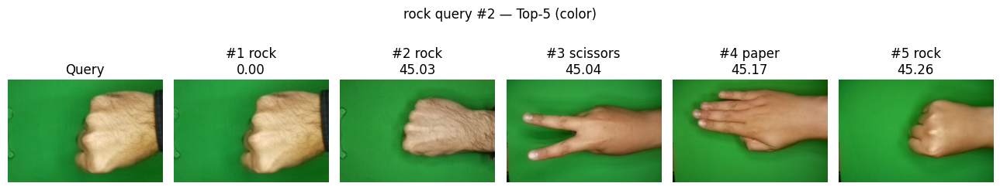


[rock #3] Query: esqqaIq6wKOr8EK6.png
  1. esqqaIq6wKOr8EK6.png | rock       | ok | d=0.0000
  2. ntumvg6vWpT6qIal.png | paper      | -- | d=5.1501
  3. cfyxwMjZmO6RYzLq.png | rock       | ok | d=6.1574
  4. aB0M38mmr711uzAY.png | rock       | ok | d=6.2542
  5. z5l2JCxLM7igVya5.png | scissors   | -- | d=6.4483


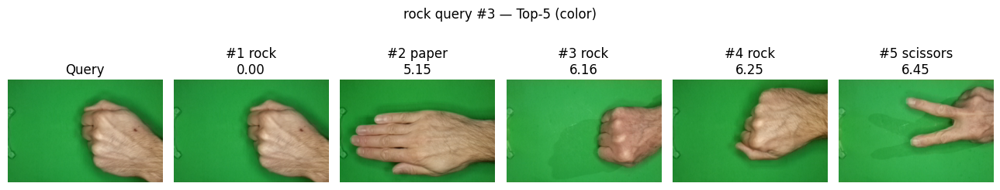


[rock #4] Query: cfyxwMjZmO6RYzLq.png
  1. cfyxwMjZmO6RYzLq.png | rock       | ok | d=0.0000
  2. wuoizA09gXbcCZ5a.png | scissors   | -- | d=2.7459
  3. cPuxKnJCdcTotM5k.png | scissors   | -- | d=2.8934
  4. Tghe750qrbh7MMpP.png | scissors   | -- | d=2.9601
  5. z5l2JCxLM7igVya5.png | scissors   | -- | d=3.0699


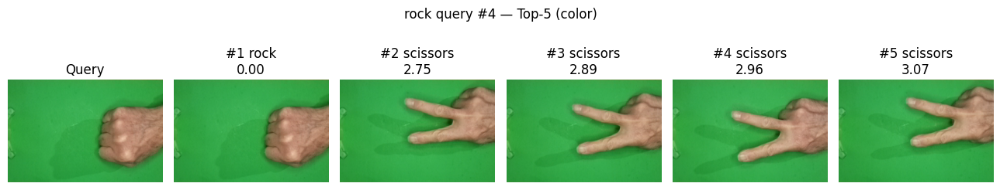


[rock #5] Query: l0XeoPGwezMDYujz.png
  1. l0XeoPGwezMDYujz.png | rock       | ok | d=0.0000
  2. HIo7Eax3OPP5MuXl.png | paper      | -- | d=10.5157
  3. esqqaIq6wKOr8EK6.png | rock       | ok | d=12.0134
  4. ntumvg6vWpT6qIal.png | paper      | -- | d=12.0507
  5. aB0M38mmr711uzAY.png | rock       | ok | d=12.6861


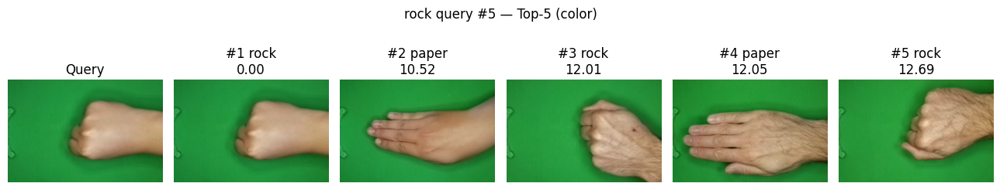


 = PAPER QUERIES (5 images) — fitur: color = 

[paper #1] Query: SjtYrw48VCBOLOQh.png
  1. SjtYrw48VCBOLOQh.png | paper      | ok | d=0.0000
  2. nOTm1e00MAJxvpwp.png | paper      | ok | d=28.1121
  3. 5uXiqEc4q2Vi0NCX.png | rock       | -- | d=29.5189
  4. 5QHP8zydBsbWyt4T.png | scissors   | -- | d=29.8511
  5. Kp9F0tIiHIT310h6.png | rock       | -- | d=29.9294


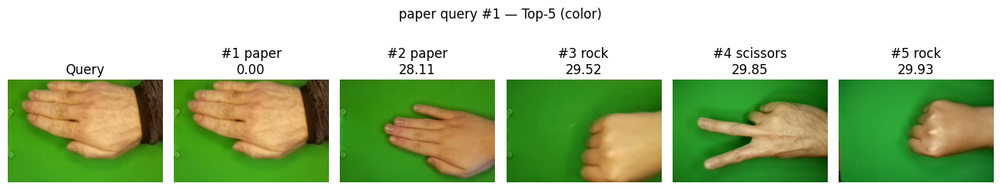


[paper #2] Query: gVd3f9CZNll3QS8l.png
  1. gVd3f9CZNll3QS8l.png | paper      | ok | d=0.0000
  2. aKUFn8PEF7LP8BaX.png | paper      | ok | d=4.5587
  3. 7gnNbHRprrV3r7kX.png | scissors   | -- | d=4.5693
  4. B08mrGoODd5gGTvu.png | paper      | ok | d=4.8657
  5. x8fNY0V8O2CJ9vaY.png | paper      | ok | d=4.9047


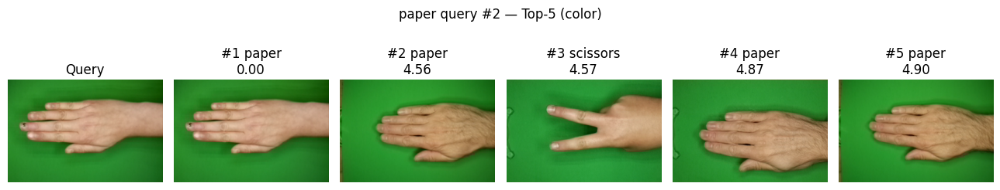


[paper #3] Query: aw7H9dMuThRnO74k.png
  1. aw7H9dMuThRnO74k.png | paper      | ok | d=0.0000
  2. B08mrGoODd5gGTvu.png | paper      | ok | d=2.7989
  3. L6O2HLgQIo7XdfdU.png | scissors   | -- | d=2.8492
  4. eb93o1ZDeBlrdfyc.png | rock       | -- | d=2.9064
  5. C9tAvywdtjDTnllg.png | paper      | ok | d=3.0063


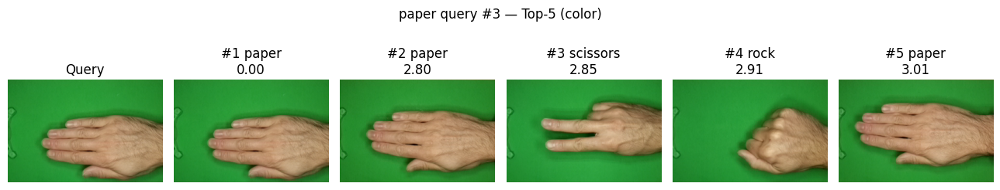


[paper #4] Query: Lq77eAG8OPaizwEd.png
  1. Lq77eAG8OPaizwEd.png | paper      | ok | d=0.0000
  2. C9tAvywdtjDTnllg.png | paper      | ok | d=3.4208
  3. B08mrGoODd5gGTvu.png | paper      | ok | d=3.5323
  4. aw7H9dMuThRnO74k.png | paper      | ok | d=3.9841
  5. 7gnNbHRprrV3r7kX.png | scissors   | -- | d=4.1624


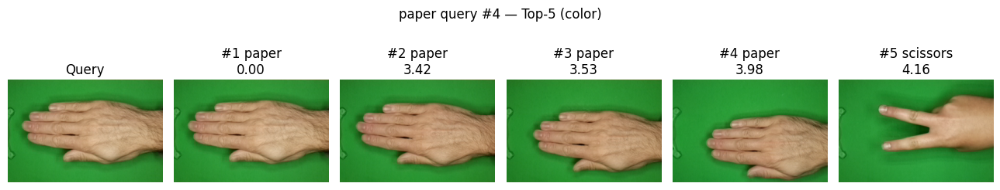


[paper #5] Query: mV9vc1ITH1PrrbF8.png
  1. mV9vc1ITH1PrrbF8.png | paper      | ok | d=0.0000
  2. UCZq5Q5ovMiGJLwX.png | rock       | -- | d=3.9170
  3. U3EwYhdeoTjy3xBf.png | rock       | -- | d=4.5049
  4. ro7qIekrW8rAUNH1.png | scissors   | -- | d=4.6009
  5. Eolm0Lo5dzVwDYqB.png | scissors   | -- | d=4.6476


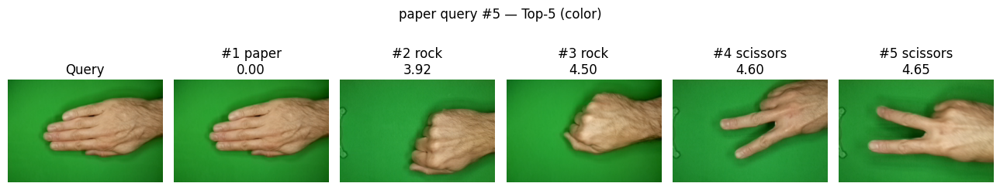


 = SCISSORS QUERIES (5 images) — fitur: color = 

[scissors #1] Query: eTkUxksFCvfsbVLs.png
  1. eTkUxksFCvfsbVLs.png | scissors   | ok | d=0.0000
  2. mkUctpckc3vjOwKa.png | paper      | -- | d=3.0520
  3. cPuxKnJCdcTotM5k.png | scissors   | ok | d=3.6196
  4. Tghe750qrbh7MMpP.png | scissors   | ok | d=3.7580
  5. z5l2JCxLM7igVya5.png | scissors   | ok | d=3.8991


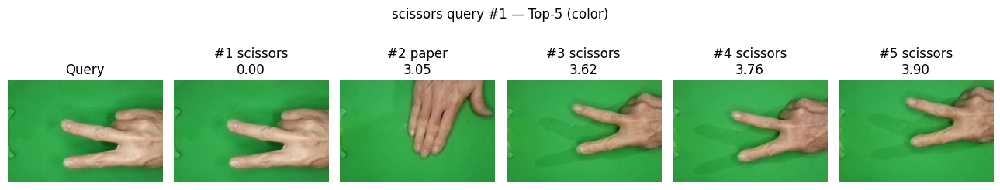


[scissors #2] Query: DH7iguASbWIzzBnT.png
  1. DH7iguASbWIzzBnT.png | scissors   | ok | d=0.0000
  2. x8fNY0V8O2CJ9vaY.png | paper      | -- | d=6.1462
  3. XQihGnpPBb3DucOm.png | paper      | -- | d=6.1948
  4. zru6yFR3dqc3SymW.png | paper      | -- | d=6.2235
  5. 7gnNbHRprrV3r7kX.png | scissors   | ok | d=6.2729


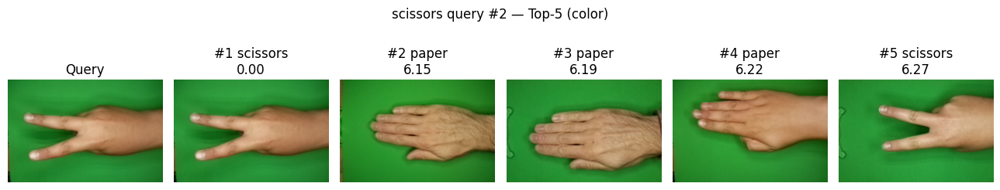


[scissors #3] Query: L6O2HLgQIo7XdfdU.png
  1. L6O2HLgQIo7XdfdU.png | scissors   | ok | d=0.0000
  2. eb93o1ZDeBlrdfyc.png | rock       | -- | d=2.7377
  3. aw7H9dMuThRnO74k.png | paper      | -- | d=2.8492
  4. C9tAvywdtjDTnllg.png | paper      | -- | d=3.0199
  5. XQihGnpPBb3DucOm.png | paper      | -- | d=3.1448


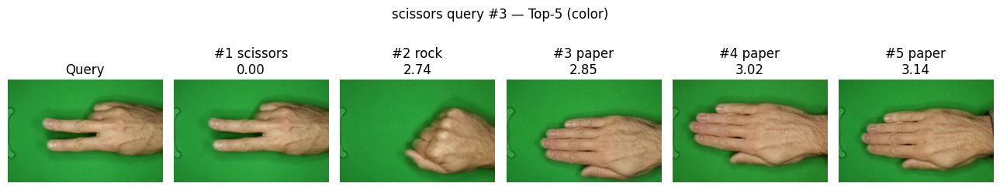


[scissors #4] Query: FFGftZrGnvN8rRqN.png
  1. FFGftZrGnvN8rRqN.png | scissors   | ok | d=0.0000
  2. Eolm0Lo5dzVwDYqB.png | scissors   | ok | d=3.7076
  3. XPvABb1iOSQx69Dq.png | scissors   | ok | d=4.5430
  4. g6KeAGhgzo4NSYWc.png | scissors   | ok | d=4.9347
  5. JUn3VuVCoOKC5Nv2.png | paper      | -- | d=5.1679


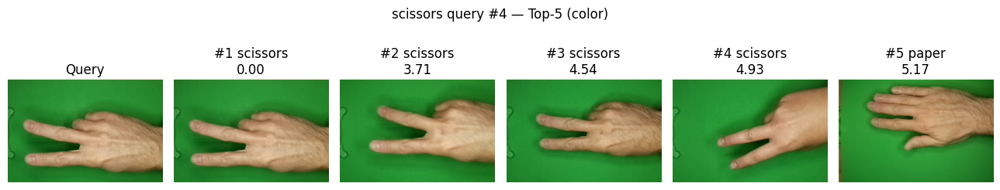


[scissors #5] Query: a9YV7Tzoj751vTun.png
  1. a9YV7Tzoj751vTun.png | scissors   | ok | d=0.0000
  2. kM3ks8HWMjhbBPWU.png | scissors   | ok | d=7.1531
  3. 5QHP8zydBsbWyt4T.png | scissors   | ok | d=7.2114
  4. mK7Kqflg12vHFBEK.png | paper      | -- | d=8.4166
  5. U3EwYhdeoTjy3xBf.png | rock       | -- | d=8.6040


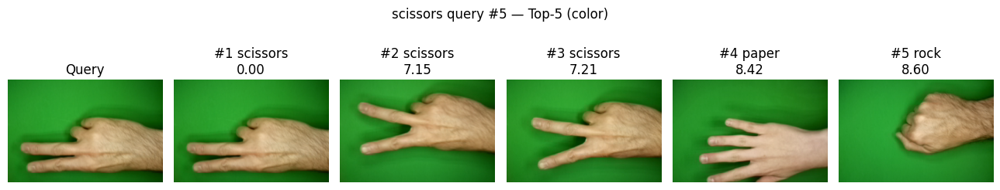


Done. Total query: 15 (target 15).


In [17]:
queries_per_class(num_per_class=5, feature="color", class_order=("rock","paper","scissors"))


query glcm tekstur


 = ROCK QUERIES (5 images) — fitur: glcm = 

[rock #1] Query: lcZcrpCoDl7Y1AUF.png
  1. lcZcrpCoDl7Y1AUF.png | rock       | ok | d=0.0000
  2. HYMbsGR9sq7jfwQp.png | scissors   | -- | d=0.6885
  3. IOa7xROJIqP2jRQE.png | scissors   | -- | d=0.7445
  4. NR48QMe5e1gskpA9.png | scissors   | -- | d=0.8270
  5. l0XeoPGwezMDYujz.png | rock       | ok | d=0.8538


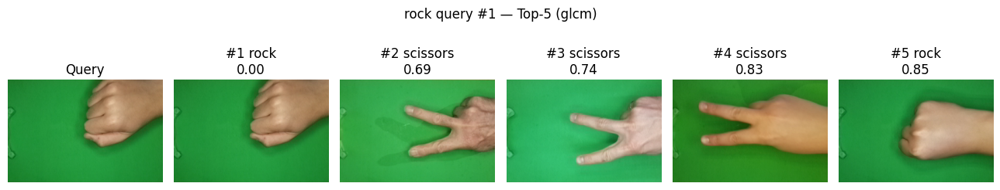


[rock #2] Query: U4HuPlTKsnXYExzJ.png
  1. U4HuPlTKsnXYExzJ.png | rock       | ok | d=0.0000
  2. zb6wXq49QppiS9sf.png | paper      | -- | d=0.6584
  3. v1b7FBFD4ZbLJnhB.png | paper      | -- | d=1.0431
  4. kM3ks8HWMjhbBPWU.png | scissors   | -- | d=1.0930
  5. 7wFK6yhjKaNkhwZs.png | rock       | ok | d=1.2279


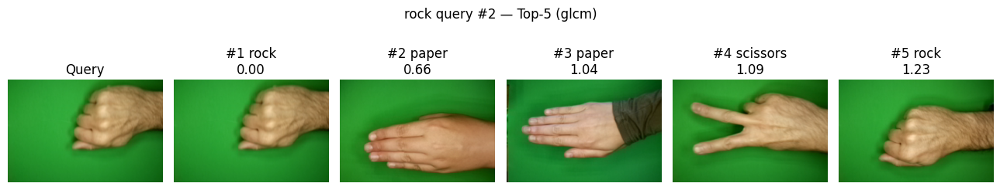


[rock #3] Query: 5uXiqEc4q2Vi0NCX.png
  1. 5uXiqEc4q2Vi0NCX.png | rock       | ok | d=0.0000
  2. 2NmrcDGkc7FQuu12.png | rock       | ok | d=0.8227
  3. sWC2BZ7oeSzsCXva.png | scissors   | -- | d=0.9809
  4. v1b7FBFD4ZbLJnhB.png | paper      | -- | d=1.0507
  5. 86KzO2PHymh6qYQ4.png | rock       | ok | d=1.1084


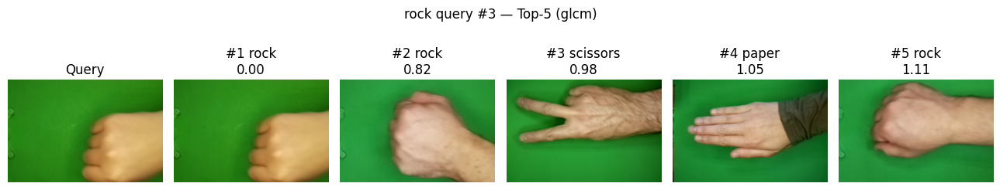


[rock #4] Query: UCZq5Q5ovMiGJLwX.png
  1. UCZq5Q5ovMiGJLwX.png | rock       | ok | d=0.0000
  2. cPuxKnJCdcTotM5k.png | scissors   | -- | d=0.3441
  3. Tghe750qrbh7MMpP.png | scissors   | -- | d=0.3813
  4. eb93o1ZDeBlrdfyc.png | rock       | ok | d=0.4274
  5. z5l2JCxLM7igVya5.png | scissors   | -- | d=0.6365


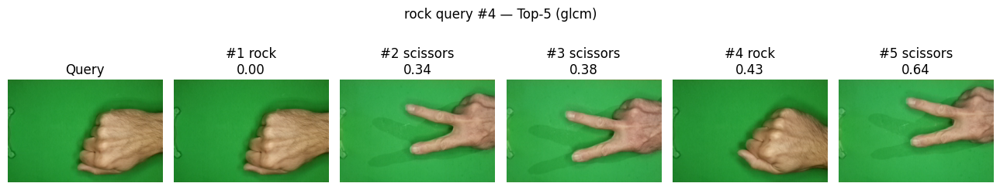


[rock #5] Query: 86KzO2PHymh6qYQ4.png
  1. 86KzO2PHymh6qYQ4.png | rock       | ok | d=0.0000
  2. pHx4pvFv4zXPDI1w.png | paper      | -- | d=0.5979
  3. 2NmrcDGkc7FQuu12.png | rock       | ok | d=0.6393
  4. 7gnNbHRprrV3r7kX.png | scissors   | -- | d=0.7177
  5. eTkUxksFCvfsbVLs.png | scissors   | -- | d=0.7527


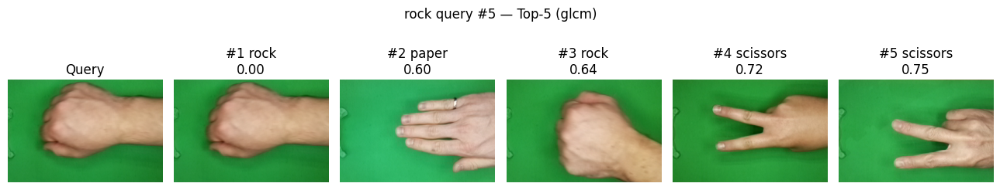


 = PAPER QUERIES (5 images) — fitur: glcm = 

[paper #1] Query: Lq77eAG8OPaizwEd.png
  1. Lq77eAG8OPaizwEd.png | paper      | ok | d=0.0000
  2. XQihGnpPBb3DucOm.png | paper      | ok | d=0.7180
  3. C9tAvywdtjDTnllg.png | paper      | ok | d=0.7319
  4. ueuECCtQxOjHF1ij.png | paper      | ok | d=0.7528
  5. pVCqrp8S6Ze3DAI8.png | paper      | ok | d=0.7752


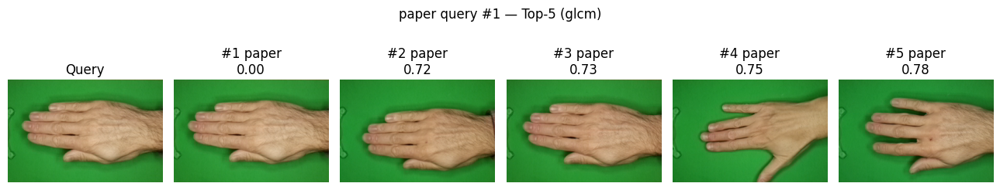


[paper #2] Query: HIo7Eax3OPP5MuXl.png
  1. HIo7Eax3OPP5MuXl.png | paper      | ok | d=0.0000
  2. nOTm1e00MAJxvpwp.png | paper      | ok | d=0.9119
  3. QbAO4VZw7Jlcenou.png | scissors   | -- | d=1.0618
  4. n61z73RnZB19Bpq8.png | rock       | -- | d=1.1684
  5. 8pxbBnbfqzX3ijVM.png | rock       | -- | d=1.1785


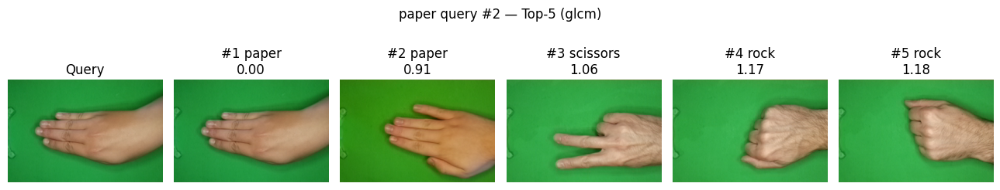


[paper #3] Query: mkUctpckc3vjOwKa.png
  1. mkUctpckc3vjOwKa.png | paper      | ok | d=0.0000
  2. Tghe750qrbh7MMpP.png | scissors   | -- | d=0.5336
  3. 3K6a8bG8j1YTH1l0.png | paper      | ok | d=0.5644
  4. bn4i63wrObqbJECw.png | rock       | -- | d=0.6250
  5. dpmWj9s5ily8GuyY.png | scissors   | -- | d=0.6451


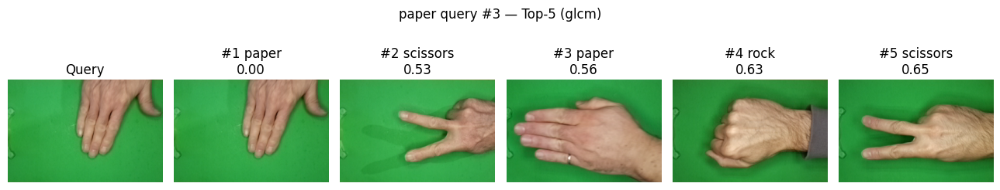


[paper #4] Query: XQihGnpPBb3DucOm.png
  1. XQihGnpPBb3DucOm.png | paper      | ok | d=0.0000
  2. aw7H9dMuThRnO74k.png | paper      | ok | d=0.2283
  3. B08mrGoODd5gGTvu.png | paper      | ok | d=0.2308
  4. dpmWj9s5ily8GuyY.png | scissors   | -- | d=0.3157
  5. QASICiZe79sFTXBz.png | paper      | ok | d=0.4712


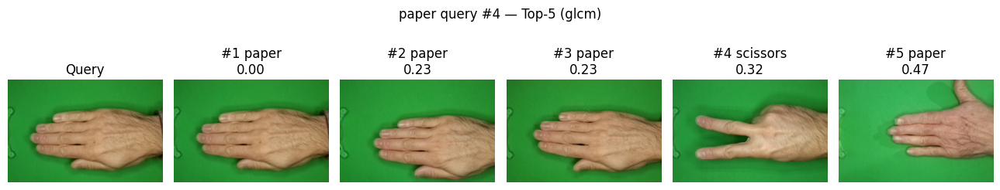


[paper #5] Query: JUn3VuVCoOKC5Nv2.png
  1. JUn3VuVCoOKC5Nv2.png | paper      | ok | d=0.0000
  2. pHx4pvFv4zXPDI1w.png | paper      | ok | d=1.0941
  3. x8fNY0V8O2CJ9vaY.png | paper      | ok | d=1.1135
  4. mkUctpckc3vjOwKa.png | paper      | ok | d=1.3764
  5. ntumvg6vWpT6qIal.png | paper      | ok | d=1.4039


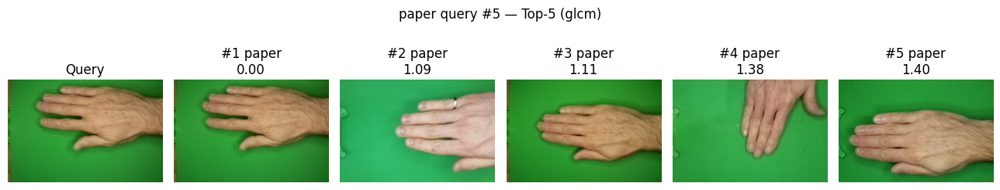


 = SCISSORS QUERIES (5 images) — fitur: glcm = 

[scissors #1] Query: Tghe750qrbh7MMpP.png
  1. Tghe750qrbh7MMpP.png | scissors   | ok | d=0.0000
  2. eb93o1ZDeBlrdfyc.png | rock       | -- | d=0.3552
  3. UCZq5Q5ovMiGJLwX.png | rock       | -- | d=0.3813
  4. cPuxKnJCdcTotM5k.png | scissors   | ok | d=0.4105
  5. 3K6a8bG8j1YTH1l0.png | paper      | -- | d=0.5038


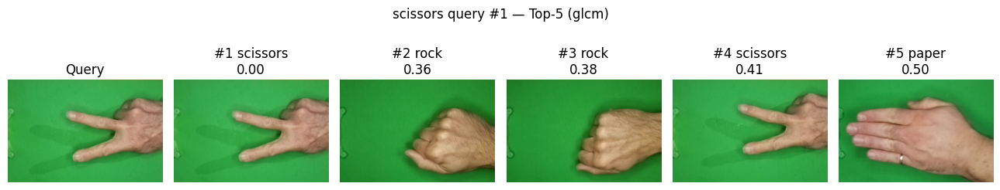


[scissors #2] Query: DH7iguASbWIzzBnT.png
  1. DH7iguASbWIzzBnT.png | scissors   | ok | d=0.0000
  2. 5inLBb6qZY0gpX3b.png | scissors   | ok | d=0.3229
  3. IkSLcJtq4O6iBmE4.png | paper      | -- | d=0.3729
  4. gVd3f9CZNll3QS8l.png | paper      | -- | d=0.4423
  5. zru6yFR3dqc3SymW.png | paper      | -- | d=0.6458


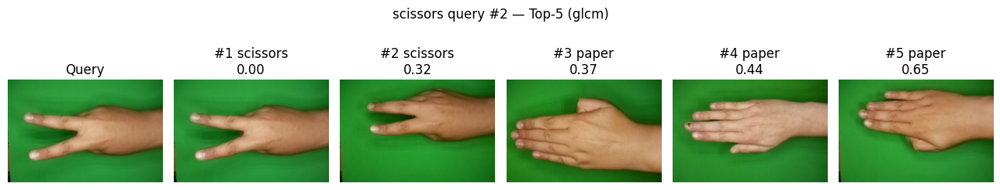


[scissors #3] Query: NR48QMe5e1gskpA9.png
  1. NR48QMe5e1gskpA9.png | scissors   | ok | d=0.0000
  2. IOa7xROJIqP2jRQE.png | scissors   | ok | d=0.4205
  3. HYMbsGR9sq7jfwQp.png | scissors   | ok | d=0.7081
  4. lcZcrpCoDl7Y1AUF.png | rock       | -- | d=0.8270
  5. l0XeoPGwezMDYujz.png | rock       | -- | d=0.9416


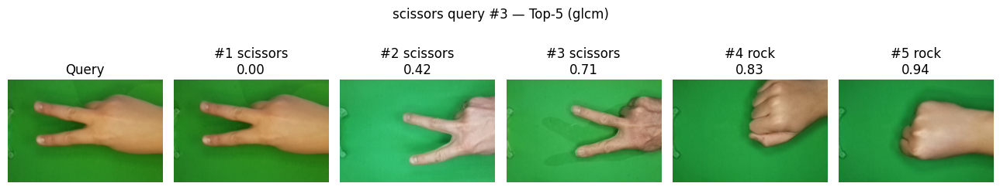


[scissors #4] Query: FFGftZrGnvN8rRqN.png
  1. FFGftZrGnvN8rRqN.png | scissors   | ok | d=0.0000
  2. Eolm0Lo5dzVwDYqB.png | scissors   | ok | d=0.3618
  3. 7gnNbHRprrV3r7kX.png | scissors   | ok | d=0.5411
  4. cY3jY96VetFq6Ayp.png | rock       | -- | d=0.8334
  5. ntumvg6vWpT6qIal.png | paper      | -- | d=0.9715


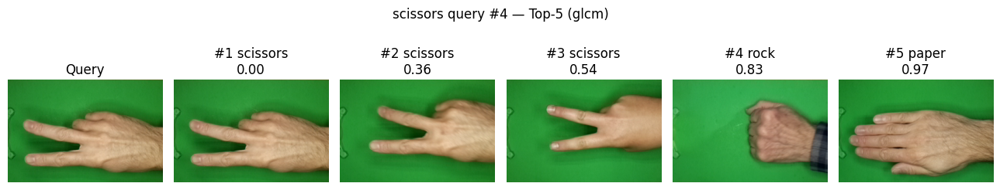


[scissors #5] Query: IOa7xROJIqP2jRQE.png
  1. IOa7xROJIqP2jRQE.png | scissors   | ok | d=0.0000
  2. NR48QMe5e1gskpA9.png | scissors   | ok | d=0.4205
  3. HYMbsGR9sq7jfwQp.png | scissors   | ok | d=0.4443
  4. lcZcrpCoDl7Y1AUF.png | rock       | -- | d=0.7445
  5. esqqaIq6wKOr8EK6.png | rock       | -- | d=0.8158


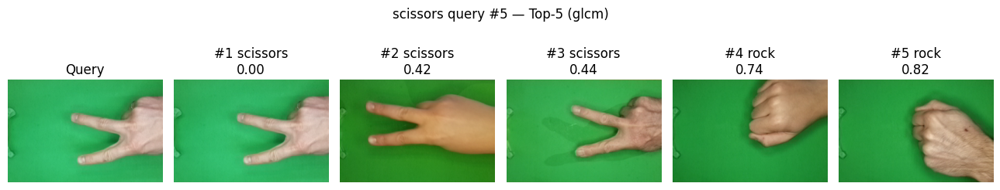


Done. Total query: 15 (target 15).


In [18]:
queries_per_class(num_per_class=5, feature="glcm", class_order=("rock","paper","scissors"))


Query Bentuk (threshold)


 = ROCK QUERIES (5 images) — fitur: shape = 

[rock #1] Query: Mwr4GgRRk6BgHDVL.png
  1. Mwr4GgRRk6BgHDVL.png | rock       | ok | d=0.0000
  2. g6KeAGhgzo4NSYWc.png | scissors   | -- | d=0.0806
  3. 7gnNbHRprrV3r7kX.png | scissors   | -- | d=0.2067
  4. aB0M38mmr711uzAY.png | rock       | ok | d=0.2491
  5. Eolm0Lo5dzVwDYqB.png | scissors   | -- | d=0.4275


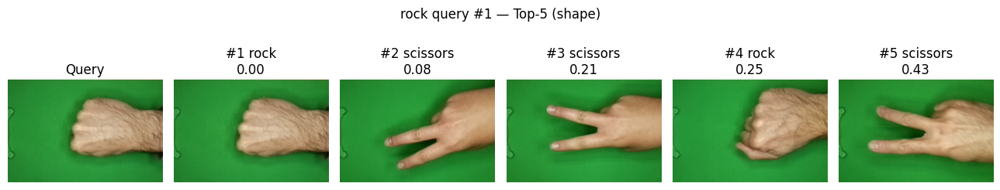


[rock #2] Query: wweMJiVO1CgNIGHW.png
  1. wweMJiVO1CgNIGHW.png | rock       | ok | d=0.0000
  2. JOaPrPIINVvoI9l4.png | rock       | ok | d=0.1693
  3. eb93o1ZDeBlrdfyc.png | rock       | ok | d=0.3761
  4. n61z73RnZB19Bpq8.png | rock       | ok | d=0.3872
  5. UCZq5Q5ovMiGJLwX.png | rock       | ok | d=0.4411


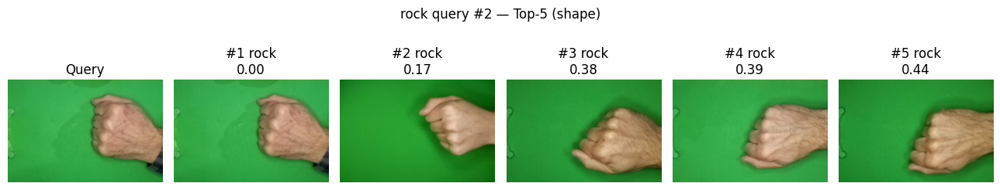


[rock #3] Query: 8pxbBnbfqzX3ijVM.png
  1. 8pxbBnbfqzX3ijVM.png | rock       | ok | d=0.0000
  2. UCZq5Q5ovMiGJLwX.png | rock       | ok | d=0.1277
  3. n61z73RnZB19Bpq8.png | rock       | ok | d=0.1540
  4. eb93o1ZDeBlrdfyc.png | rock       | ok | d=0.2062
  5. Kp9F0tIiHIT310h6.png | rock       | ok | d=0.2390


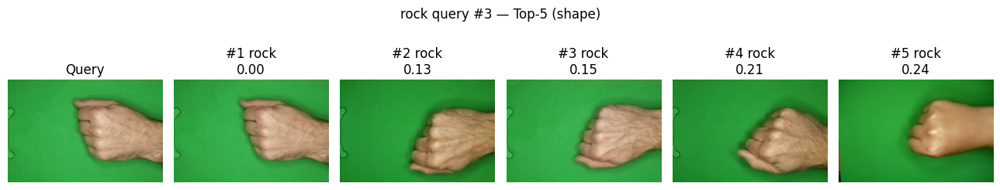


[rock #4] Query: 86KzO2PHymh6qYQ4.png
  1. 86KzO2PHymh6qYQ4.png | rock       | ok | d=0.0000
  2. zb6wXq49QppiS9sf.png | paper      | -- | d=0.2012
  3. B08mrGoODd5gGTvu.png | paper      | -- | d=0.2014
  4. NR48QMe5e1gskpA9.png | scissors   | -- | d=0.3551
  5. aKUFn8PEF7LP8BaX.png | paper      | -- | d=0.4075


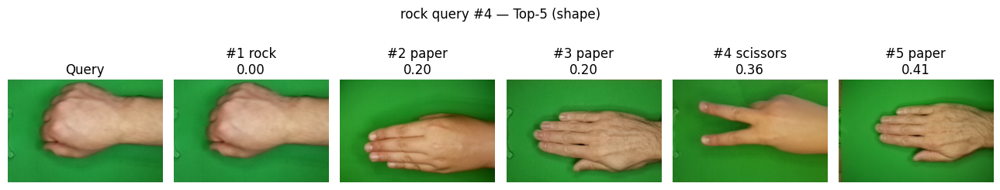


[rock #5] Query: Kp9F0tIiHIT310h6.png
  1. Kp9F0tIiHIT310h6.png | rock       | ok | d=0.0000
  2. 8pxbBnbfqzX3ijVM.png | rock       | ok | d=0.2390
  3. UCZq5Q5ovMiGJLwX.png | rock       | ok | d=0.3481
  4. n61z73RnZB19Bpq8.png | rock       | ok | d=0.3892
  5. eb93o1ZDeBlrdfyc.png | rock       | ok | d=0.4243


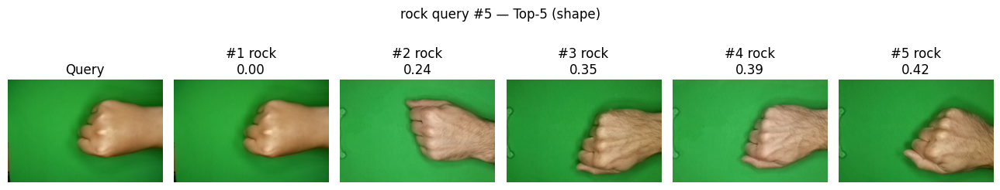


 = PAPER QUERIES (5 images) — fitur: shape = 

[paper #1] Query: 3K6a8bG8j1YTH1l0.png
  1. 3K6a8bG8j1YTH1l0.png | paper      | ok | d=0.0000
  2. IkSLcJtq4O6iBmE4.png | paper      | ok | d=0.7839
  3. ntumvg6vWpT6qIal.png | paper      | ok | d=1.0253
  4. Lq77eAG8OPaizwEd.png | paper      | ok | d=1.2008
  5. pVCqrp8S6Ze3DAI8.png | paper      | ok | d=1.5021


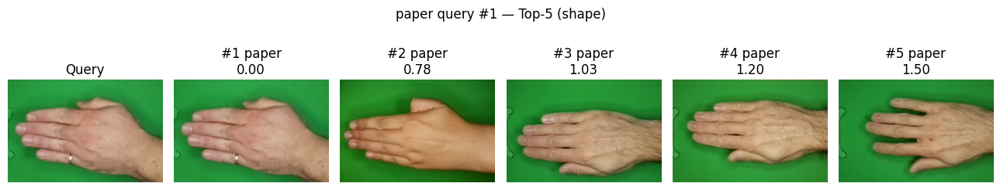


[paper #2] Query: zb6wXq49QppiS9sf.png
  1. zb6wXq49QppiS9sf.png | paper      | ok | d=0.0000
  2. NR48QMe5e1gskpA9.png | scissors   | -- | d=0.1852
  3. 86KzO2PHymh6qYQ4.png | rock       | -- | d=0.2012
  4. aKUFn8PEF7LP8BaX.png | paper      | ok | d=0.2242
  5. B08mrGoODd5gGTvu.png | paper      | ok | d=0.3294


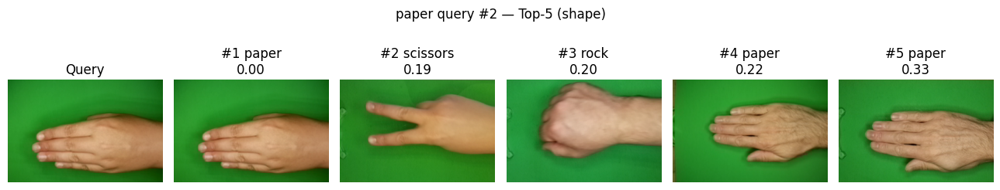


[paper #3] Query: mV9vc1ITH1PrrbF8.png
  1. mV9vc1ITH1PrrbF8.png | paper      | ok | d=0.0000
  2. v1b7FBFD4ZbLJnhB.png | paper      | ok | d=0.0000
  3. nKBG8QSEBTwgkoVp.png | rock       | -- | d=0.0000
  4. bn4i63wrObqbJECw.png | rock       | -- | d=0.0000
  5. clIAiFiURAZ36c8y.png | rock       | -- | d=0.0000


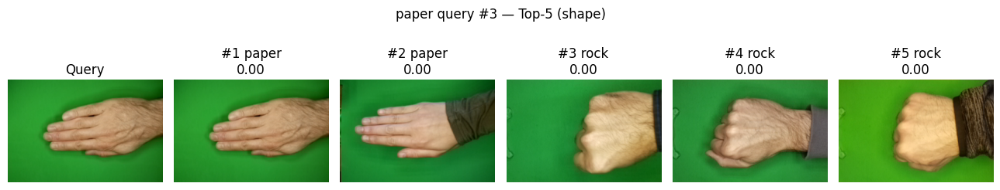


[paper #4] Query: v1b7FBFD4ZbLJnhB.png
  1. mV9vc1ITH1PrrbF8.png | paper      | ok | d=0.0000
  2. v1b7FBFD4ZbLJnhB.png | paper      | ok | d=0.0000
  3. nKBG8QSEBTwgkoVp.png | rock       | -- | d=0.0000
  4. bn4i63wrObqbJECw.png | rock       | -- | d=0.0000
  5. clIAiFiURAZ36c8y.png | rock       | -- | d=0.0000


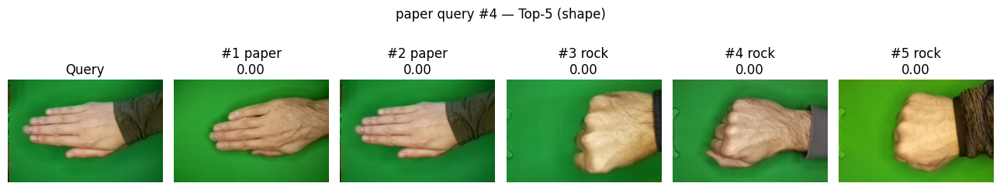


[paper #5] Query: B08mrGoODd5gGTvu.png
  1. B08mrGoODd5gGTvu.png | paper      | ok | d=0.0000
  2. 86KzO2PHymh6qYQ4.png | rock       | -- | d=0.2014
  3. XQihGnpPBb3DucOm.png | paper      | ok | d=0.2513
  4. zb6wXq49QppiS9sf.png | paper      | ok | d=0.3294
  5. C9tAvywdtjDTnllg.png | paper      | ok | d=0.5032


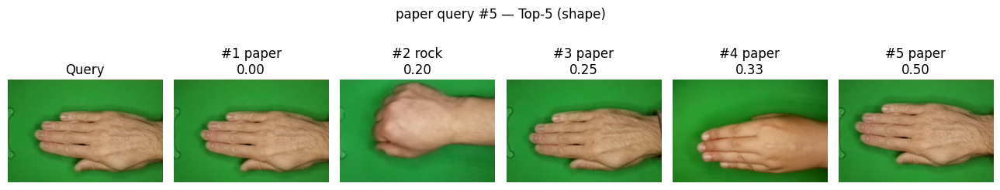


 = SCISSORS QUERIES (5 images) — fitur: shape = 

[scissors #1] Query: sWC2BZ7oeSzsCXva.png
  1. sWC2BZ7oeSzsCXva.png | scissors   | ok | d=0.0000
  2. kM3ks8HWMjhbBPWU.png | scissors   | ok | d=0.4435
  3. a9YV7Tzoj751vTun.png | scissors   | ok | d=0.4688
  4. x8fNY0V8O2CJ9vaY.png | paper      | -- | d=0.4852
  5. 5QHP8zydBsbWyt4T.png | scissors   | ok | d=0.4943


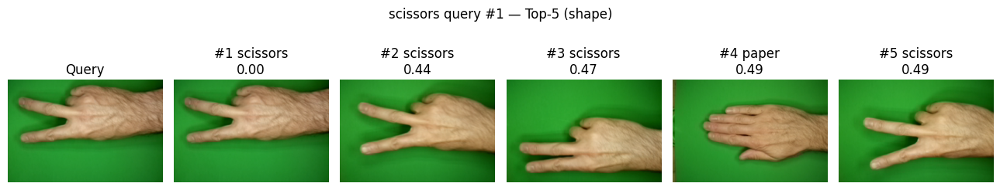


[scissors #2] Query: 5inLBb6qZY0gpX3b.png
  1. 5inLBb6qZY0gpX3b.png | scissors   | ok | d=0.0000
  2. IOa7xROJIqP2jRQE.png | scissors   | ok | d=0.1634
  3. U3EwYhdeoTjy3xBf.png | rock       | -- | d=0.1859
  4. eTkUxksFCvfsbVLs.png | scissors   | ok | d=0.2455
  5. ro7qIekrW8rAUNH1.png | scissors   | ok | d=0.3053


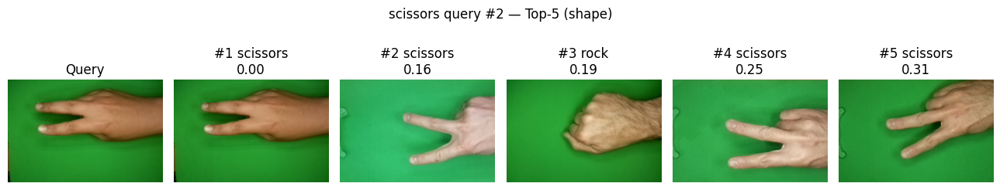


[scissors #3] Query: wuoizA09gXbcCZ5a.png
  1. wuoizA09gXbcCZ5a.png | scissors   | ok | d=0.0000
  2. HYMbsGR9sq7jfwQp.png | scissors   | ok | d=0.0497
  3. cPuxKnJCdcTotM5k.png | scissors   | ok | d=0.1163
  4. z5l2JCxLM7igVya5.png | scissors   | ok | d=0.1434
  5. Tghe750qrbh7MMpP.png | scissors   | ok | d=0.1998


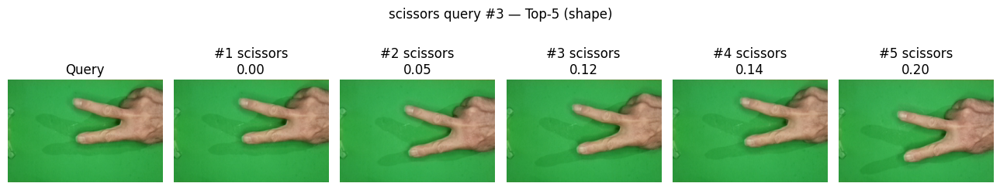


[scissors #4] Query: 8ei3rSl89D6W8Tav.png
  1. 8ei3rSl89D6W8Tav.png | scissors   | ok | d=0.0000
  2. 5uXiqEc4q2Vi0NCX.png | rock       | -- | d=0.8990
  3. esqqaIq6wKOr8EK6.png | rock       | -- | d=1.4348
  4. l0XeoPGwezMDYujz.png | rock       | -- | d=1.5568
  5. mK7Kqflg12vHFBEK.png | paper      | -- | d=1.5571


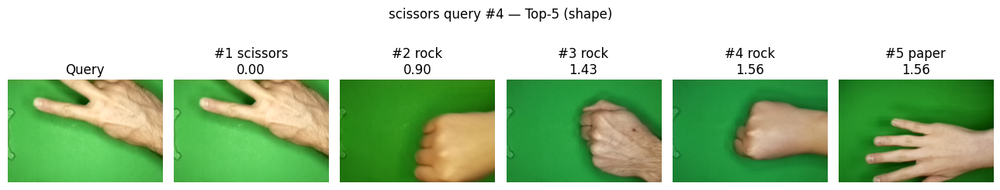


[scissors #5] Query: NR48QMe5e1gskpA9.png
  1. NR48QMe5e1gskpA9.png | scissors   | ok | d=0.0000
  2. aKUFn8PEF7LP8BaX.png | paper      | -- | d=0.0608
  3. zb6wXq49QppiS9sf.png | paper      | -- | d=0.1852
  4. HIo7Eax3OPP5MuXl.png | paper      | -- | d=0.2896
  5. 86KzO2PHymh6qYQ4.png | rock       | -- | d=0.3551


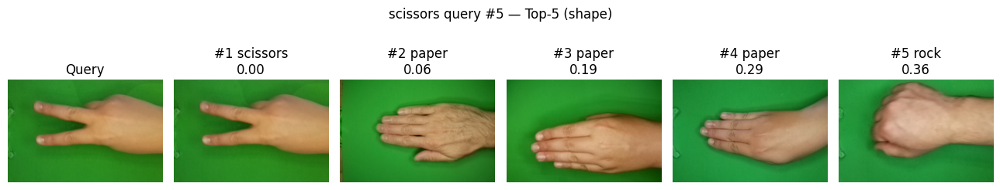


Done. Total query: 15 (target 15).


In [19]:
queries_per_class(num_per_class=5, feature="shape", class_order=("rock","paper","scissors"))


## **Evaluasi p@5

In [20]:
def evaluate_precision_from_block8(num_per_class=5, feature="combined", class_order=("rock","paper","scissors")):
    """
    Evaluate Precision@5 using the same 15 queries (5 per class).
    Each query compares against the full dataset.
    """

    from collections import defaultdict
    import numpy as np


    items_by_class = defaultdict(list)
    for path, cls in dataset:
        items_by_class[cls].append(path)


    def pick_feature_space(which):
        if which == "color":
            return db_color_s, lambda q: sc_color.transform([extract_color_features(q)])[0]
        if which == "glcm":
            return db_tex_s,   lambda q: sc_tex.transform([extract_texture_features(q)])[0]
        if which == "shape":
            return db_shape_s, lambda q: sc_shape.transform([extract_shape_features(q)])[0]
        # combined
        return db_combined, lambda q: np.concatenate([
            WEIGHT_COLOR  * sc_color.transform([extract_color_features(q)])[0],
            WEIGHT_TEXTURE* sc_tex.transform([extract_texture_features(q)])[0],
            WEIGHT_SHAPE  * sc_shape.transform([extract_shape_features(q)])[0],
        ])

    db_feats, qfeat_fn = pick_feature_space(feature)


    queries = []
    for cls in class_order:
        pool = items_by_class.get(cls, [])
        if not pool:
            continue
        if len(pool) >= num_per_class:
            picks = random.sample(pool, num_per_class)
        else:
            picks = [random.choice(pool) for _ in range(num_per_class)]
        for p in picks:
            queries.append((p, cls))


    results_table = []
    for q_path, q_cls in queries:
        q_img = imread_rgb(q_path)
        q_feat = qfeat_fn(q_img)
        ranked = rank(db_feats, q_feat, TOP_K, USE_COSINE)
        p5 = sum(db_meta[idx][1] == q_cls for idx, _ in ranked) / TOP_K
        results_table.append((os.path.basename(q_path), q_cls, p5))


    per_class = defaultdict(list)
    for _, cls, p in results_table:
        per_class[cls].append(p)
    print("\nPrecision@5 per Query:")
    for qname, cls, p5 in results_table:
        print(f"{cls:10s} | {qname:20s} | P@5 = {p5:.2f}")

    print("\nAverage P@5 per Class:")
    for cls, vals in per_class.items():
        print(f"  {cls:10s}: {np.mean(vals):.3f}")

    macro = np.mean([np.mean(v) for v in per_class.values()])
    print(f"\nMacro-average Precision@5 {len(queries)} queries: {macro:.3f}")

# Run
evaluate_precision_from_block8(num_per_class=5, feature="combined")



Precision@5 per Query:
rock       | zrrYLvM2uywyFwRy.png | P@5 = 0.20
rock       | wweMJiVO1CgNIGHW.png | P@5 = 0.20
rock       | 5uXiqEc4q2Vi0NCX.png | P@5 = 0.60
rock       | cY3jY96VetFq6Ayp.png | P@5 = 0.40
rock       | Mwr4GgRRk6BgHDVL.png | P@5 = 0.20
paper      | x8fNY0V8O2CJ9vaY.png | P@5 = 0.80
paper      | zru6yFR3dqc3SymW.png | P@5 = 0.80
paper      | ntumvg6vWpT6qIal.png | P@5 = 0.40
paper      | QASICiZe79sFTXBz.png | P@5 = 0.40
paper      | aKUFn8PEF7LP8BaX.png | P@5 = 0.80
scissors   | L6O2HLgQIo7XdfdU.png | P@5 = 0.40
scissors   | FFGftZrGnvN8rRqN.png | P@5 = 0.80
scissors   | wuoizA09gXbcCZ5a.png | P@5 = 1.00
scissors   | 8ei3rSl89D6W8Tav.png | P@5 = 0.40
scissors   | HYMbsGR9sq7jfwQp.png | P@5 = 1.00

Average P@5 per Class:
  rock      : 0.320
  paper     : 0.640
  scissors  : 0.720

Macro-average Precision@5 15 queries: 0.560


P@5 glcm

In [21]:
evaluate_precision_from_block8(num_per_class=5, feature="glcm")


Precision@5 per Query:
rock       | 2NmrcDGkc7FQuu12.png | P@5 = 0.80
rock       | l0XeoPGwezMDYujz.png | P@5 = 0.60
rock       | eb93o1ZDeBlrdfyc.png | P@5 = 0.20
rock       | zrrYLvM2uywyFwRy.png | P@5 = 0.80
rock       | cY3jY96VetFq6Ayp.png | P@5 = 0.40
paper      | SjtYrw48VCBOLOQh.png | P@5 = 0.40
paper      | IkSLcJtq4O6iBmE4.png | P@5 = 0.40
paper      | zb6wXq49QppiS9sf.png | P@5 = 0.60
paper      | mkUctpckc3vjOwKa.png | P@5 = 0.40
paper      | 3K6a8bG8j1YTH1l0.png | P@5 = 0.40
scissors   | a9YV7Tzoj751vTun.png | P@5 = 0.40
scissors   | DH7iguASbWIzzBnT.png | P@5 = 0.40
scissors   | QbAO4VZw7Jlcenou.png | P@5 = 0.40
scissors   | HYMbsGR9sq7jfwQp.png | P@5 = 0.40
scissors   | 5inLBb6qZY0gpX3b.png | P@5 = 0.40

Average P@5 per Class:
  rock      : 0.560
  paper     : 0.440
  scissors  : 0.400

Macro-average Precision@5 15 queries: 0.467


P@5 bentuk

In [22]:
evaluate_precision_from_block8(num_per_class=5, feature="shape")


Precision@5 per Query:
rock       | clIAiFiURAZ36c8y.png | P@5 = 0.60
rock       | cY3jY96VetFq6Ayp.png | P@5 = 0.60
rock       | lcZcrpCoDl7Y1AUF.png | P@5 = 0.80
rock       | n61z73RnZB19Bpq8.png | P@5 = 1.00
rock       | nu556y52qDHFKRYy.png | P@5 = 0.40
paper      | zru6yFR3dqc3SymW.png | P@5 = 0.60
paper      | SjtYrw48VCBOLOQh.png | P@5 = 0.60
paper      | JUn3VuVCoOKC5Nv2.png | P@5 = 0.80
paper      | 3K6a8bG8j1YTH1l0.png | P@5 = 1.00
paper      | ntumvg6vWpT6qIal.png | P@5 = 1.00
scissors   | dpmWj9s5ily8GuyY.png | P@5 = 0.40
scissors   | 1VRzspyXpQ6A2rKy.png | P@5 = 1.00
scissors   | wuoizA09gXbcCZ5a.png | P@5 = 1.00
scissors   | 8ei3rSl89D6W8Tav.png | P@5 = 0.20
scissors   | L6O2HLgQIo7XdfdU.png | P@5 = 0.80

Average P@5 per Class:
  rock      : 0.680
  paper     : 0.800
  scissors  : 0.680

Macro-average Precision@5 15 queries: 0.720


P@5 warna

In [23]:
evaluate_precision_from_block8(num_per_class=5, feature="color")



Precision@5 per Query:
rock       | JOaPrPIINVvoI9l4.png | P@5 = 0.60
rock       | zrrYLvM2uywyFwRy.png | P@5 = 0.20
rock       | cY3jY96VetFq6Ayp.png | P@5 = 0.40
rock       | aB0M38mmr711uzAY.png | P@5 = 0.40
rock       | 86KzO2PHymh6qYQ4.png | P@5 = 0.60
paper      | aw7H9dMuThRnO74k.png | P@5 = 0.60
paper      | pHx4pvFv4zXPDI1w.png | P@5 = 0.60
paper      | SjtYrw48VCBOLOQh.png | P@5 = 0.40
paper      | v1b7FBFD4ZbLJnhB.png | P@5 = 0.60
paper      | aKUFn8PEF7LP8BaX.png | P@5 = 0.80
scissors   | kM3ks8HWMjhbBPWU.png | P@5 = 0.40
scissors   | QbAO4VZw7Jlcenou.png | P@5 = 0.40
scissors   | kyzq1dNdXgG9OZDb.png | P@5 = 0.80
scissors   | a9YV7Tzoj751vTun.png | P@5 = 0.60
scissors   | z5l2JCxLM7igVya5.png | P@5 = 1.00

Average P@5 per Class:
  rock      : 0.440
  paper     : 0.600
  scissors  : 0.640

Macro-average Precision@5 15 queries: 0.560


Evaluasi Akhir


Evaluating feature: COLOR
rock       | n61z73RnZB19Bpq8.png | P@5 = 0.40
rock       | CkjdMgxvvA6Ll8Ca.png | P@5 = 0.40
rock       | 7wFK6yhjKaNkhwZs.png | P@5 = 0.60
rock       | zrrYLvM2uywyFwRy.png | P@5 = 0.20
rock       | nu556y52qDHFKRYy.png | P@5 = 0.60
paper      | gVd3f9CZNll3QS8l.png | P@5 = 0.80
paper      | nOTm1e00MAJxvpwp.png | P@5 = 0.40
paper      | JUn3VuVCoOKC5Nv2.png | P@5 = 1.00
paper      | aw7H9dMuThRnO74k.png | P@5 = 0.60
paper      | v1b7FBFD4ZbLJnhB.png | P@5 = 0.60
scissors   | IOa7xROJIqP2jRQE.png | P@5 = 0.40
scissors   | kM3ks8HWMjhbBPWU.png | P@5 = 0.40
scissors   | dpmWj9s5ily8GuyY.png | P@5 = 0.40
scissors   | L6O2HLgQIo7XdfdU.png | P@5 = 0.20
scissors   | XPvABb1iOSQx69Dq.png | P@5 = 0.60

Evaluating feature: GLCM
rock       | nKBG8QSEBTwgkoVp.png | P@5 = 0.60
rock       | 7wFK6yhjKaNkhwZs.png | P@5 = 0.40
rock       | 2NmrcDGkc7FQuu12.png | P@5 = 0.80
rock       | l0XeoPGwezMDYujz.png | P@5 = 0.60
rock       | esqqaIq6wKOr8EK6.png | P@5 = 0.60
paper  

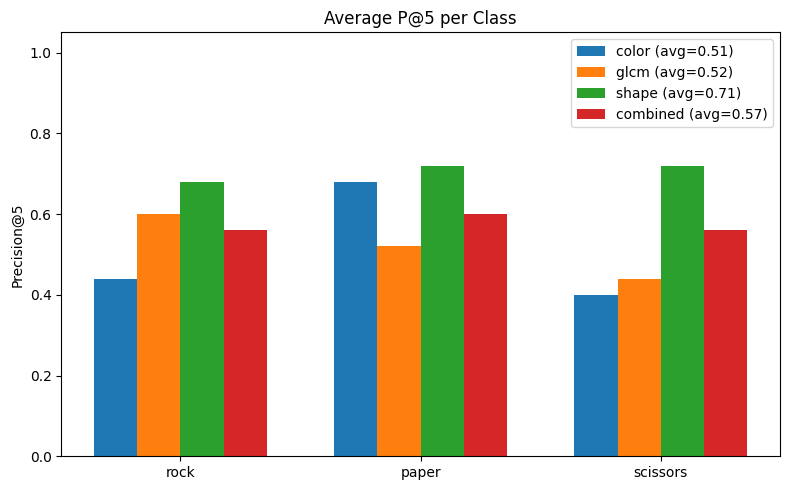

In [24]:
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict

def evaluate_p5_queries_per_class(num_per_class=5, class_order=("rock","paper","scissors"), seed=42):

    if seed is not None:
        random.seed(seed)

    features = ["color", "glcm", "shape", "combined"]
    items_by_class = defaultdict(list)
    for path, cls in dataset:
        items_by_class[cls].append(path)


    scores = {f: defaultdict(list) for f in features}

    for feat in features:
        if feat == "color":
            db_feats = db_color_s
            q_fn = lambda q: sc_color.transform([extract_color_features(q)])[0]
        elif feat == "glcm":
            db_feats = db_tex_s
            q_fn = lambda q: sc_tex.transform([extract_texture_features(q)])[0]
        elif feat == "shape":
            db_feats = db_shape_s
            q_fn = lambda q: sc_shape.transform([extract_shape_features(q)])[0]
        else:
            db_feats = db_combined
            q_fn = lambda q: np.concatenate([
                WEIGHT_COLOR  * sc_color.transform([extract_color_features(q)])[0],
                WEIGHT_TEXTURE* sc_tex.transform([extract_texture_features(q)])[0],
                WEIGHT_SHAPE  * sc_shape.transform([extract_shape_features(q)])[0],
            ])

        print(f"\nEvaluating feature: {feat.upper()}")

        for cls in class_order:
            pool = items_by_class.get(cls, [])
            if not pool:
                continue

            picks = random.sample(pool, min(len(pool), num_per_class))
            while len(picks) < num_per_class:
                picks.append(random.choice(pool))

            for p in picks:
                q_img = imread_rgb(p)
                q_feat = q_fn(q_img)
                ranked = rank(db_feats, q_feat, TOP_K, USE_COSINE)
                p5 = sum(db_meta[idx][1] == cls for idx, _ in ranked) / TOP_K
                scores[feat][cls].append(p5)
                print(f"{cls:10s} | {os.path.basename(p):20s} | P@5 = {p5:.2f}")


    per_class_avg = {f: {cls: np.mean(vals) for cls, vals in d.items()} for f, d in scores.items()}
    macro_avg = {f: np.mean(list(v.values())) for f, v in per_class_avg.items()}


    print("\nAverage Precision@5 per Class:")
    table = []
    for cls in class_order:
        row = [cls] + [f"{per_class_avg[f].get(cls, np.nan):.2f}" for f in features]
        table.append(row)
    print(tabulate(table, headers=["Class", "Color", "GLCM", "Shape", "Combined"], tablefmt="github"))
    print("\nMacro Averages:", {k: f"{v:.3f}" for k, v in macro_avg.items()})

    plt.figure(figsize=(8,5))
    x = np.arange(len(class_order))
    width = 0.18
    offsets = [-1.5, -0.5, 0.5, 1.5]

    for i, f in enumerate(features):
        vals = [per_class_avg[f].get(c, 0) for c in class_order]
        plt.bar(x + offsets[i]*width, vals, width, label=f"{f} (avg={macro_avg[f]:.2f})")

    plt.xticks(x, class_order)
    plt.ylim(0, 1.05)
    plt.ylabel("Precision@5")
    plt.title("Average P@5 per Class")
    plt.legend()
    plt.tight_layout()
    plt.show()

    return per_class_avg, macro_avg

per_class_avg, macro_avg = evaluate_p5_queries_per_class(num_per_class=5)
